In [1]:
colab = False
if colab:
    from google.colab import drive
    drive.mount('/content/drive')

In [2]:
if colab:
    import os
    os.chdir('/content/drive/My Drive/P3')

# Watch out for unexpected movie recommendations !

# Introduction

Our primary goal is to enhance content-based recommendations by uncovering hidden topics within movie plots using Latent Dirichlet Allocation (LDA). By identifying these latent themes, we can move beyond conventional genre-based recommendations to suggest movies with deeper, thematic similarities.

<div style="border-left: 6px solid rgba(69, 157, 185, 1);border-radius:5px; box-shadow: 3px 3px 3px rgba(221, 221, 221, 1);" >
    <p style="background-color: rgba(69, 157, 185, 0.1); font-weight:bold; padding: 8px 0 8px 15px;">Analysis</p>
    <div style="padding: 0 0 2px 10px;">
    
**What will be covered :**
- **Part 1 :** Data Exploration and Processing
- **Part 2 :** Topics Detection
- **Part 3 :** Are topics linked to genres?
- **Part 4 (Bonus) :** Recommendation algorithm
- **Part 5 :** Recommendation Analysis
- **Part 6 :** Additional features Analysis

</div></div>
<br/>

---

# Part 1.1 : Data Exploration and Processing

### Import libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import plotly.offline as pyo
import plotly.graph_objects as go
import plotly.express as px
from IPython.display import Image
#import streamlit as st
#from wordcloud import WordCloud
from collections import Counter

# Setting notebook to work offline
pyo.init_notebook_mode()
import ast
import os
import sys
sys.path.append(os.path.abspath("src/utils"))
!pip install IMDbPY
from helpers import *

# LDA
#import spacy
import nltk
#nltk.download('punkt')
#nltk.download('stopwords')
# gensim is a popular library for topic modelling
from gensim.corpora import Dictionary
from gensim.models import LdaModel
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
import pickle

from imdb import IMDb
import re
import kagglehub # To extract synopsis dataframes

# Worcloud
from ipywidgets import interact, widgets

# Linear Regression 
from sklearn.preprocessing import StandardScaler

## 1.1 Dataset exploration

### Load initial movie dataset

In [23]:
movie_columnns =['Wikipedia movie ID','Freebase movie ID', 'Movie name', 'Movie release date', 'Movie box office revenue', 'Movie runtime', 'Movie languages', 'Movie countries', 'Movie genres']
movie = pd.read_csv('Data/movie.metadata.tsv', sep='\t', header=None, names=movie_columnns)

print('The dataset contains', movie.shape[0], 'movies and',movie.shape[1] , 'features.')
movie.head()

The dataset contains 81741 movies and 9 features.


,Wikipedia movie ID,Freebase movie ID,Movie name,Movie release date,Movie box office revenue,Movie runtime,Movie languages,Movie countries,Movie genres
0,975900,/m/03vyhn,Ghosts of Mars,2001-08-24,14010832.0,98.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/01jfsb"": ""Thriller"", ""/m/06n90"": ""Science..."
1,3196793,/m/08yl5d,Getting Away with Murder: The JonBenét Ramsey ...,2000-02-16,NaN,95.0,"{""/m/02h40lc"": ""English Language""}","{""/m/09c7w0"": ""United States of America""}","{""/m/02n4kr"": ""Mystery"", ""/m/03bxz7"": ""Biograp..."
2,28463795,/m/0crgdbh,Brun bitter,1988,NaN,83.0,"{""/m/05f_3"": ""Norwegian Language""}","{""/m/05b4w"": ""Norway""}","{""/m/0lsxr"": ""Crime Fiction"", ""/m/07s9rl0"": ""D..."
3,9363483,/m/0285_cd,White Of The Eye,1987,NaN,110.0,"{""/m/02h40lc"": ""English Language""}","{""/m/07ssc"": ""United Kingdom""}","{""/m/01jfsb"": ""Thriller"", ""/m/0glj9q"": ""Erotic..."
4,261236,/m/01mrr1,A Woman in Flames,1983,NaN,106.0,"{""/m/04306rv"": ""German Language""}","{""/m/0345h"": ""Germany""}","{""/m/07s9rl0"": ""Drama""}"


## Features Descriptions

| Column                | Description                                                                        |
|-----------------------|------------------------------------------------------------------------------------|
| Wikipedia movie ID    | An identifier for each movie from Wikipedia.                                       |
| Freebase movie ID     | A unique identifier for each movie from the Freebase database.                     |
| Movie name            | The title of the movie.                                                            |
| Movie release date    | The date when the movie was released, formatted as `YYYY-MM-DD`.                   |
| Movie box office revenue | The revenue generated by the movie at the box office (in dollars). |
| Movie runtime         | The duration of the movie in minutes. |
| Movie languages       | A dictionary where keys represent Freebase language IDs, and values represent the language names (e.g., English, Norwegian, German). |
| Movie countries       | A dictionary where keys are Freebase country IDs, and values are country names representing where the movie was produced. |
| Movie genres          | A dictionary where each key represents a Freebase genre ID, and each value represents the corresponding genre of the movie. |

### Comment
Not all features will be useful to our analysis:
- `Freebase movie ID` is not used in the analysis

#### Drop columns

In [24]:
# Creat new df with updated columns
movie_drop = movie.drop(['Freebase movie ID'], axis=1)

# Visual check
movie_drop.columns

Index(['Wikipedia movie ID', 'Movie name', 'Movie release date',
       'Movie box office revenue', 'Movie runtime', 'Movie languages',
       'Movie countries', 'Movie genres'],
      dtype='object')

Columns has been efficiently dropped.

## Features types

In [25]:
pd.DataFrame(movie_drop.dtypes, columns=['Type'])

,Type
Wikipedia movie ID,int64
Movie name,object
Movie release date,object
Movie box office revenue,float64
Movie runtime,float64
Movie languages,object
Movie countries,object
Movie genres,object


### Comment
1. The `Movie languages`, `Movie countries` and `Movie genres` are stored in dictionnaries with `Freebase movie ID` as keys. Since the `Freebase movie ID` are not kept the dictionnaries will be changed to keep values only.

2. For our analysis, having the full release date in `Movie release date` isn't necessary, just the year is enough. Therefore, we convert the release date into a year format (e.g. 1995-07-21 becomes 1995).

In [26]:
movies_df = movie_drop.copy()
movies_df['Movie genres'] = convert_to_list(movies_df, 'Movie genres')
movies_df['Movie languages'] = convert_to_list(movies_df, 'Movie languages')
movies_df['Movie countries'] = convert_to_list(movies_df, 'Movie countries')

movies_df[['Movie genres','Movie languages', 'Movie countries']].head()

,Movie genres,Movie languages,Movie countries
0,"[Thriller, Science Fiction, Horror, Adventure,...",[English Language],[United States of America]
1,"[Mystery, Biographical film, Drama, Crime Drama]",[English Language],[United States of America]
2,"[Crime Fiction, Drama]",[Norwegian Language],[Norway]
3,"[Thriller, Erotic thriller, Psychological thri...",[English Language],[United Kingdom]
4,[Drama],[German Language],[Germany]


We can now see that the columns containing information about movie languages, countries, and genres are indeed formatted as lists.

In [27]:
# Convert string to year
movies_df['Movie release date'] = movies_df['Movie release date'].apply(extract_year).astype('Int64')

# Check that all movies release dates are encoded in years
print(movies_df['Movie release date'].head())

0    2001
1    2000
2    1988
3    1987
4    1983
Name: Movie release date, dtype: Int64


The release dates are now in years format!

# 1.2 Getting Synopses
To discover the underlying topics of the movies with LDA we will need the synopses. We decide not to use the movies summaries since they encode significantly less context and would result in less confident clustering.

### Synopses
For synopses the MPST dataset is used, this dataset is usually used for supervised learning of tags prediction using plot synopsis.



In [28]:
# Load data
synopsis = pd.read_csv('Data/mpst_full_data.csv')

# Check data shape
print("This synopsis dataframe is of size:", synopsis.shape)

# Display df
synopsis.head()

This synopsis dataframe is of size: (14828, 6)


,imdb_id,title,plot_synopsis,tags,split,synopsis_source
0,tt0057603,I tre volti della paura,Note: this synopsis is for the orginal Italian...,"cult, horror, gothic, murder, atmospheric",train,imdb
1,tt1733125,Dungeons & Dragons: The Book of Vile Darkness,"Two thousand years ago, Nhagruul the Foul, a s...",violence,train,imdb
2,tt0033045,The Shop Around the Corner,"Matuschek's, a gift store in Budapest, is the ...",romantic,test,imdb
3,tt0113862,Mr. Holland's Opus,"Glenn Holland, not a morning person by anyone'...","inspiring, romantic, stupid, feel-good",train,imdb
4,tt0086250,Scarface,"In May 1980, a Cuban man named Tony Montana (A...","cruelty, murder, dramatic, cult, violence, atm...",val,imdb


In [29]:
display(synopsis[synopsis['imdb_id'] == 'tt0023427']) # année 1932
display(synopsis[synopsis['imdb_id'] == 'tt0086250']) # année 1983

,imdb_id,title,plot_synopsis,tags,split,synopsis_source
4066,tt0023427,Scarface,The film opens with a statement that the film ...,"violence, murder",train,imdb


,imdb_id,title,plot_synopsis,tags,split,synopsis_source
4,tt0086250,Scarface,"In May 1980, a Cuban man named Tony Montana (A...","cruelty, murder, dramatic, cult, violence, atm...",val,imdb


### MPST Features
| Column                | Description                                                                        |
|-----------------------|------------------------------------------------------------------------------------|
| imdb_id	    | An identifier for each movie from IMdB.                                       |
| plot_synopsis	     | Whole movie plot description.                     |
| title            | The title of the movie.                                                            |
| tags	    | Topics present in the movie..                   |
| split | Describe if used for training, validation or testing. |
| synopsis_source         | Plateform from which the synopsis. |


### Comment
Not all features will be useful to our analysis:
- The `split` feature is not relevant since we perform an unsupervised analysis
- `synopsis_source` is not used in the analysis

So both of those features will be dropped.

## Combinig both datasets

In [30]:
# Merge by matching titles
movies_syn = synopsis.merge(movies_df, left_on='title', right_on='Movie name', how='inner')

# Remove columns
movies_syn.drop(columns=['title', 'split', 'synopsis_source'], inplace=True)

# Display
movies_syn.head(3)

,imdb_id,plot_synopsis,tags,Wikipedia movie ID,Movie name,Movie release date,Movie box office revenue,Movie runtime,Movie languages,Movie countries,Movie genres
0,tt1733125,"Two thousand years ago, Nhagruul the Foul, a s...",violence,30855958,Dungeons & Dragons: The Book of Vile Darkness,2012,NaN,90.0,[],[United Kingdom],[Fantasy]
1,tt0033045,"Matuschek's, a gift store in Budapest, is the ...",romantic,76353,The Shop Around the Corner,1940,NaN,98.0,[English Language],[United States of America],"[Romantic comedy, Workplace Comedy, Black-and-..."
2,tt0113862,"Glenn Holland, not a morning person by anyone'...","inspiring, romantic, stupid, feel-good",171076,Mr. Holland's Opus,1995,106269971.0,130.0,"[English Language, American Sign Language]",[United States of America],"[Inspirational Drama, Family Film, Drama, Musi..."


### How many movies have no matching synopsis?

In [31]:
# Compare size before and after merge
lost_rows = synopsis.shape[0] - movies_syn.shape[0]
print(f"We only lost {lost_rows} movies by merging the two dataset by the titles of the movies.")

We only lost 94 movies by merging the two dataset by the titles of the movies.


### Comment

1. Movie loss: The size fo the dataframe has not significantly changed, only 94 movies did not match. Our original movie df contained most of the movies present in the synopsis df.

2. Same title: We also observe that Scarface appears twice since there was a remake. For the rest for the analysis we will assume that if the name of the movie is exactly the same, the synopsis is pretty similar for both movies (if not the same!).

# 1.3 Getting Ratings
Rating reflect important information when talking about recommendation. They directly reflect how much someone enjoyed a movie.
Thus we found an IMdB dataset online which contains movie ratings.

In [32]:
# Load dataset
ratings_df = pd.read_csv('Data/title.ratings.tsv', sep='\t')
ratings_df.head()

,tconst,averageRating,numVotes
0,tt0000001,5.7,2100
1,tt0000002,5.6,282
2,tt0000003,6.5,2119
3,tt0000004,5.4,182
4,tt0000005,6.2,2850


### Columns
| Feature         | Description                                      |
|-----------------|--------------------------------------------------|
| tconst          | IMDb ID (unique identifier for a movie)           |
| average rating  | Mean of all ratings given to the movie           |
| numVotes        | Number of people who rated the movie             |

Since both of our datasets contain information about the `imdb_id`, we can merge them using this information.

## Merging both datasets

In [33]:
# Merge
movies_ratings = pd.merge(movies_syn,ratings_df,left_on='imdb_id', right_on='tconst',how='inner')

# Remove redundant columns
movies_ratings = movies_ratings.drop(['tconst'], axis=1)

# Display
movies_ratings.head(3)

,imdb_id,plot_synopsis,tags,Wikipedia movie ID,Movie name,Movie release date,Movie box office revenue,Movie runtime,Movie languages,Movie countries,Movie genres,averageRating,numVotes
0,tt1733125,"Two thousand years ago, Nhagruul the Foul, a s...",violence,30855958,Dungeons & Dragons: The Book of Vile Darkness,2012,NaN,90.0,[],[United Kingdom],[Fantasy],4.4,2722
1,tt0033045,"Matuschek's, a gift store in Budapest, is the ...",romantic,76353,The Shop Around the Corner,1940,NaN,98.0,[English Language],[United States of America],"[Romantic comedy, Workplace Comedy, Black-and-...",8.0,39420
2,tt0113862,"Glenn Holland, not a morning person by anyone'...","inspiring, romantic, stupid, feel-good",171076,Mr. Holland's Opus,1995,106269971.0,130.0,"[English Language, American Sign Language]",[United States of America],"[Inspirational Drama, Family Film, Drama, Musi...",7.3,42244


## Comment: Complete Dataset
Our dataset is complete! We can start to analyse the data.

In [34]:
# save .csv file to import it in box_office_extraction.py
movies_ratings.to_csv('Data/movies_ratings.csv', index=False)

# Part 2: Data Analysis

## Part 2.1 Handling Missing Values

Our dataset is now complete for the analysis, however we need to check the NaN values before.

In [35]:
# Replace empty lists with NaN
movies_ratings = movies_ratings.applymap(replace_empty_with_nan)
movies_ratings.head(2)

,imdb_id,plot_synopsis,tags,Wikipedia movie ID,Movie name,Movie release date,Movie box office revenue,Movie runtime,Movie languages,Movie countries,Movie genres,averageRating,numVotes
0,tt1733125,"Two thousand years ago, Nhagruul the Foul, a s...",violence,30855958,Dungeons & Dragons: The Book of Vile Darkness,2012,NaN,90.0,NaN,[United Kingdom],[Fantasy],4.4,2722
1,tt0033045,"Matuschek's, a gift store in Budapest, is the ...",romantic,76353,The Shop Around the Corner,1940,NaN,98.0,[English Language],[United States of America],"[Romantic comedy, Workplace Comedy, Black-and-...",8.0,39420


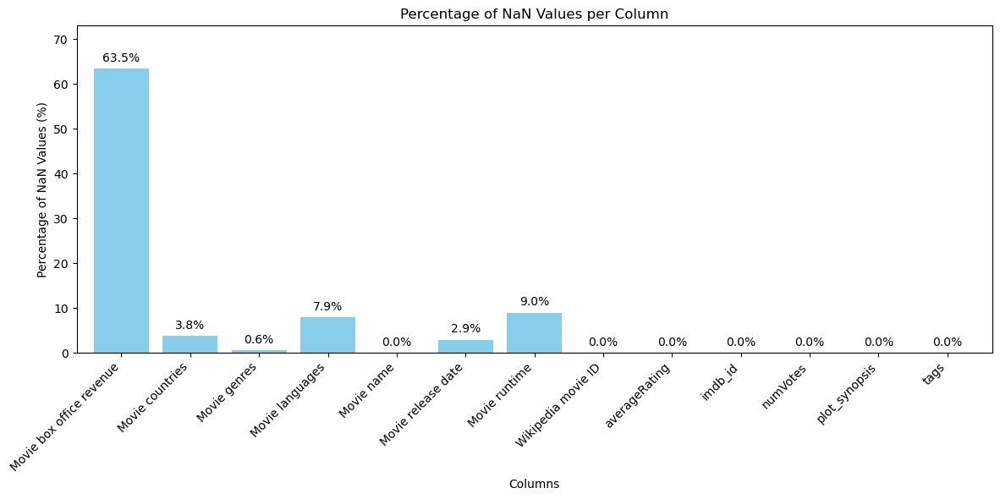

In [36]:
# Calculate percentage of NaN values in each column
na_percentage = (movies_ratings.isna().sum() / len(movies_ratings)) * 100
na_percentage = na_percentage.sort_index()

# Plot
plt.figure(figsize=(12, 6))
bars = na_percentage.plot(kind='bar', color='skyblue', width=0.8)

# Add percentage labels on top of each bar
for i, value in enumerate(na_percentage):
    plt.text(i, value + 1, f'{value:.1f}%', ha='center', va='bottom', fontsize=10)

plt.xlabel('Columns')
plt.xticks(rotation=45, ha='right')
plt.ylabel('Percentage of NaN Values (%)')
plt.ylim(top =73)
plt.title('Percentage of NaN Values per Column')
plt.tight_layout()

plt.show()


Five columns contain Missing values:
- `Movie box office revenue` which has 63.5% of missing values, is very problematic, since this feature is used to answer some research questions. We will try to find external information to fill the gaps.
- `Movie languages` with 7.9% of NaNs
- `Movie countries` with 3.8% of NaNs
- `Movie release date` with 2.9% of NaNs
- `Movie genres` with 0.6% of NanS
- `Movie runtime` with 9.0% of NanS

### Handling Nans for Movie box office revenue

Since not all the features are used in all analysis we will first handle the `Movies genres` missing values for the LDA analysis. And in a second time handle all features missing values for the features analysis.


#### Handling NaNs Features Analysis

**Box office**

Since the number of NaNs in the box-office revenue column is significant we try to enrich the dataset with data from IMbD. The code to extract the box office with the IMdB library can be found in the `src/scripts/box_office_extraction.py` file. The run time is very long, therefore we run it one time and save the results in a .csv file that we import here.

In [37]:
#Here is the file with completed box-office from Imdb (last column)
new_movies_dataset = pd.read_csv('Data/movies_synopsis_comp.csv')

# Add IMDB box office to original dataset
movies_ratings['IMDB Box-office'] = new_movies_dataset['IMDB Box-office']

#Improvement in NaN values in box-office
na_percentage_box_init = (movies_ratings['Movie box office revenue'].isna().sum() / len(movies_ratings)) * 100
na_percentage_box_imdb = (movies_ratings['IMDB Box-office'].isna().sum() / len(movies_ratings)) * 100
print(f"We went from {round(na_percentage_box_init,2)}% of NaN values to {round(na_percentage_box_imdb,2)}%.")
movies_ratings.drop('Movie box office revenue', axis=1, inplace=True) # Remove old column


We went from 63.47% of NaN values to 54.8%.


### Comment
The increase is a bit deceiving. The IMDB library is missing a lot of box-offices too. We suspect the IMDB library to maybe block requests when there are too many, giving more NaN values than there actually are. In the end that's still an increase of 11% in box-office data size. Since we expect the box office to play an important role in movies' similarities we chose to remove all movies with no box office information

In [38]:
features_df = movies_ratings.dropna()

# Display
print("Out of", movies_ratings.shape[0],"movies",  movies_ratings.shape[0] - features_df.shape[0], "have missing information and were removed from the dataset")
features_df.head()
features_df.to_csv('features_df.csv', index=False)

# Save features


Out of 14686 movies 9048 have missing information and were removed from the dataset


### Handling Nans LDA analysis
We remove movies with no information on `Movie genres` since we are interested in the genre for our topic analysis.

In [39]:
# Drop all movies with no Movie release dates
LDA_df = movies_ratings[['imdb_id', 'Movie name', 'plot_synopsis', 'tags', 'Movie genres', 'averageRating']].dropna(subset=['Movie genres'])

# Display
print("Out of", movies_ratings.shape[0],"movies",  movies_ratings.shape[0]-LDA_df.shape[0], "have missing genre information and were removed from the dataset")
LDA_df.head()

# Save final df
LDA_df.to_csv('Data/LDA_movie.csv', index=False)

Out of 14686 movies 82 have missing genre information and were removed from the dataset


## Part 2.2 Data exploration

We have both clean dataframes Let's look at their distributions

### Movies' summaries exploration

In [40]:
# Lengths of each plot synopsis
summary_lengths = LDA_df['plot_synopsis'].apply(len)

# Stats of plot synopsis length
LDA_df['plot_synopsis'].apply(lambda x: len(x)).describe().round()

count    14604.0
mean      5427.0
std       5028.0
min        656.0
25%       2616.0
50%       4000.0
75%       6169.0
max      63959.0
Name: plot_synopsis, dtype: float64

Comment
There is a difference between the mean and the median. Let's have a look at the distribution

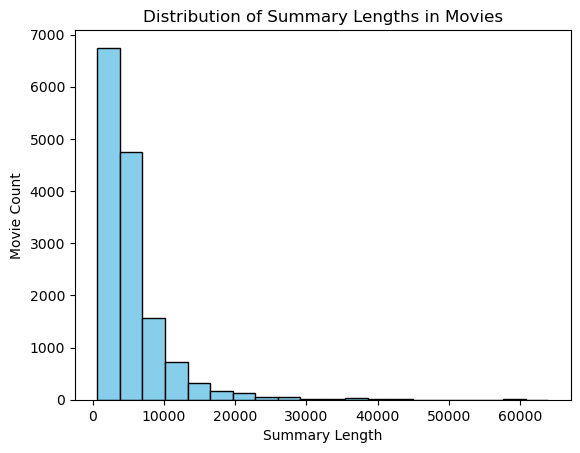

In [41]:
# Plot the histogram
plt.hist(summary_lengths, bins=20, color='skyblue', edgecolor='black')
plt.ylabel('Movie Count')  # y-axis will be the count of movies
plt.xlabel('Summary Length')  # x-axis will be the length of the summaries
plt.title('Distribution of Summary Lengths in Movies')
plt.show()

### Movies' genres exploration

Number of unique genres: 333


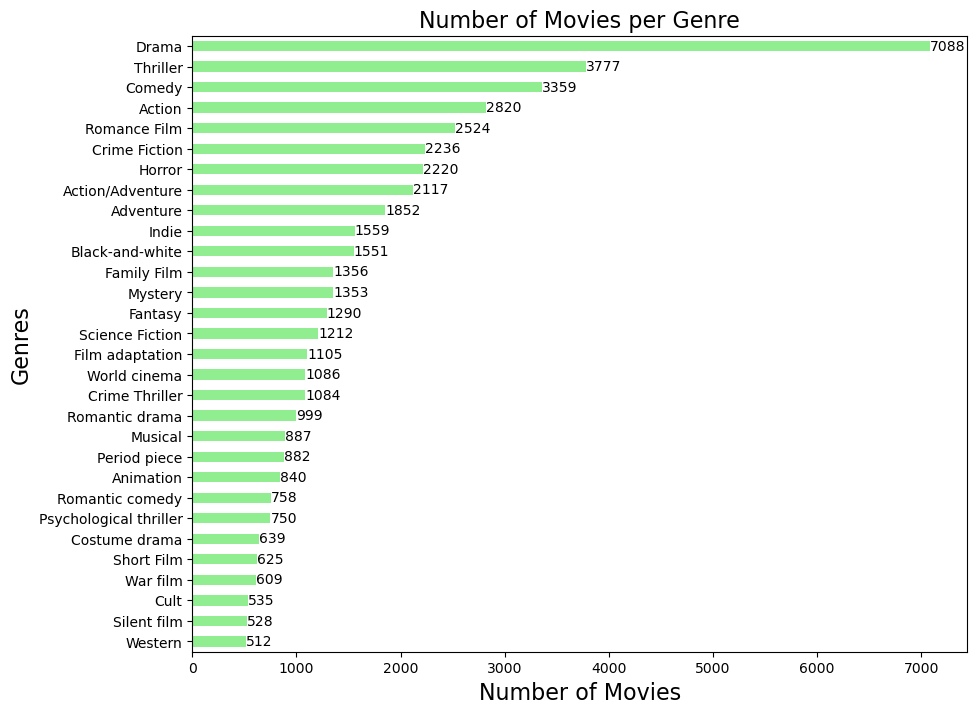

In [42]:
all_genres = LDA_df['Movie genres'].explode() # Changes elements from a list to a row

num_unique_genre = all_genres.nunique() # Creates list which each type of genre in all_genres
print("Number of unique genres:", num_unique_genre)

# Plot the number of movies per top 30 genres

genres_counts = all_genres.value_counts()

plt.figure(figsize=(10, 8))
bars = genres_counts.head(30).sort_values(ascending=True).plot(kind='barh', color='lightgreen') # kind='barh' allows us to flip the axis
for index, value in enumerate(genres_counts.head(30).sort_values(ascending=True)):
    plt.text(value, index, str(value), va='center')
plt.xlabel('Number of Movies', fontsize=16)
plt.ylabel('Genres', fontsize=16)
plt.title('Number of Movies per Genre', fontsize=16)
plt.show()

# CHANGE COMMENT!!!

*Comment: Drama is the clear leader when it comes to movie genres, followed by Comedy and Romance. This makes sense since these genres appeal to a wide range of audiences. Genres like Thriller, Action, and Documentary are also popular, showing that people enjoy excitement and real-life stories. On the other end, niche genres like 'Cult' and 'Political drama' are much less common, which isn't surprising given their more specific audience.*

*Here we decided to show only the top 30 genres to keep the chart clear and easy to read.*

In [43]:
# Create an interactive widget for genre selection
interact(generate_wordcloud, 
    genre=widgets.Dropdown(options=genres_counts.index, description='Genre:'),
    file=widgets.fixed(LDA_df),  
    target1=widgets.fixed('Movie genres'),
    target2=widgets.fixed('plot_synopsis') 
)

interactive(children=(Dropdown(description='Genre:', options=('Drama', 'Thriller', 'Comedy', 'Action', 'Romanc…

<function helpers.generate_wordcloud(genre, file, target1, target2)>

From the word clouds across different genres, we observe that certain words, such as 'find,' 'tell,' 'one,' and 'see,' appear consistently across all genres. This is expected, as these are commonly used words. However, their large presence makes it difficult to discern clear trends or distinctions among the genres. We will handle this before performing LDA.

# Part 2: Latent Dirichlet Allocation (LDA)
LDA offers a way to cluster together movies that reflect similar themes, based on textual descriptions. The model does unsupervised learning, as the themes fo the movies are not known. Our problem was that the movie summaries only give too few informations to use LDA. That's why we extracted the synopsis of the movies through another dataset called "Movie Plot Synopses with Tags" (MPST). Those synopsis are around 10 times longer than the summaries, giving way more informations to the LDA model.

## 2.1 Preprocessing

To preprocess the synopses, we use the `spacy` analyzer for English language. We apply the following pipeline to the synopses :

### Preprocess pipeline
1.   Tokenization
2.   Stop words, punctuation and numbers removal (except dates)
3.   Lemmatization
4.   Remove character names
5. Add bigrams


Removing stop words and character names before using LDA is important as those very frequent words are useless when defining global themes. Bigrams are sequences of two words that could capture additionnal informations so we add them.

_Load the dataframe that we produced earlier_

In [25]:
movie_final = pd.read_csv('Data/LDA_movie.csv') #Import our dataframe

synopses = movie_final['plot_synopsis'].tolist() #Convert synopses column to a list
movie_ids = movie_final['imdb_id'].tolist() #Convert IMDB_ID column to a list
print(f'Number of synopses : {len(synopses)}')

movie_final.head()

Number of synopses : 14604


,imdb_id,Movie name,plot_synopsis,tags,Movie genres,averageRating
0,tt1733125,Dungeons & Dragons: The Book of Vile Darkness,"Two thousand years ago, Nhagruul the Foul, a s...",violence,['Fantasy'],4.4
1,tt0033045,The Shop Around the Corner,"Matuschek's, a gift store in Budapest, is the ...",romantic,"['Romantic comedy', 'Workplace Comedy', 'Black...",8.0
2,tt0113862,Mr. Holland's Opus,"Glenn Holland, not a morning person by anyone'...","inspiring, romantic, stupid, feel-good","['Inspirational Drama', 'Family Film', 'Drama'...",7.3
3,tt0086250,Scarface,"In May 1980, a Cuban man named Tony Montana (A...","cruelty, murder, dramatic, cult, violence, atm...","['Crime Fiction', 'Gangster Film', 'Black-and-...",8.3
4,tt0086250,Scarface,"In May 1980, a Cuban man named Tony Montana (A...","cruelty, murder, dramatic, cult, violence, atm...","['Crime Fiction', 'Thriller', 'Gangster Film',...",8.3


_Load the spacy analyzer in English_

In [26]:
'''
Thomas = True #A enlever tout a la fin mais sinon ca marche pas pour moi snif
if Thomas:
    nlp = spacy.load('/opt/anaconda3/lib/python3.12/site-packages/en_core_web_sm/en_core_web_sm-3.7.1')
else:
    nlp = spacy.load("en_core_web_sm") Ajouter cette ligne quand on a fini
nlp.remove_pipe("parser") #We don't need the parser (win comp. time)
'''

'\nThomas = True #A enlever tout a la fin mais sinon ca marche pas pour moi snif\nif Thomas:\n    nlp = spacy.load(\'/opt/anaconda3/lib/python3.12/site-packages/en_core_web_sm/en_core_web_sm-3.7.1\')\nelse:\n    nlp = spacy.load("en_core_web_sm") Ajouter cette ligne quand on a fini\nnlp.remove_pipe("parser") #We don\'t need the parser (win comp. time)\n'

_Preprocess synopses_

**Note:** The following cell performs preprocessing on movie synopses. It takes a while to run, since it processes a large dataset. To skip this cell you can use the resulting file saved in `Data/processed_data.txt` instead by setting `run_processing` to `False`.


In [27]:
from gensim.models.phrases import Phrases

run_processing = False

if run_processing:
    docs = list()
    for doc in nlp.pipe(synopses, n_process=5, batch_size=10):

        ents = doc.ents  # Get entities

        # Lemmatize tokens (running --> run) after removing numbers, punctuation, stopwords and entities.
        doc = [token.lemma_ for token in doc if token.is_alpha and not token.is_stop and len(token) > 2 and token.ent_type_ == ""]

        # Add entities, but only if they are not character names and longer than 1 word (as it's usually character names not recognized as PERSON).
        doc.extend([str(entity) for entity in ents if len(entity) > 1 and entity.label_ != "PERSON"])
        docs.append(doc)

        # Save file
        path_file = 'Data/processed_data.txt'
        with open(path_file, "wb") as file:
            pickle.dump(docs, file)
else:
    path_file = 'Data/processed_data.txt'
    with open(path_file, "rb") as file:
        docs = pickle.load(file)

_Add bigrams_

In [28]:
# Add bigrams to docs (only ones that appear 15 times or more).
bigram = Phrases(docs, min_count=15)
for idx in range(len(docs)):
    for token in bigram[docs[idx]]:
        if '_' in token: # Token is a bigram, add to document.
            docs[idx].append(token)

In [29]:
#TO REMOVE AT THE END
'''# Create the processed file
path_file = 'Data/processed_data.txt'
# Save processed synopses to a file
with open(path_file, "wb") as file:
    pickle.dump(docs, file)'''

'# Create the processed file\npath_file = \'Data/processed_data.txt\'\n# Save processed synopses to a file\nwith open(path_file, "wb") as file:\n    pickle.dump(docs, file)'

Let's see the result of our preprocessing :

In [30]:
print(f'Original : {synopses[0]}')
print(f'Preprocessed : {docs[0]}')

Original : Two thousand years ago, Nhagruul the Foul, a sorcerer who reveled in corrupting the innocent and the spread of despair, neared the end of his mortal days and was dismayed. Consumed by hatred for the living, Nhagruul sold his soul to the demon Lords of the abyss so that his malign spirit would survive. In an excruciating ritual, Nhagrulls skin was flayed into pages, his bones hammered into a cover, and his diseased blood became the ink to pen a book most vile. Creatures vile and depraved rose from every pit and unclean barrow to partake in the fever of destruction. The kingdoms of Karkoth were consumed by this plague of evil until an order of holy warriors arose from the ashes. The Knights of the New Sun swore an oath to resurrect hope in the land. The purity of their hearts was so great that Pelor, the God of Light, gave the Knights powerful amulets with which to channel his power. Transcendent with divine might, the Knights of the New Sun pierced the shadow that had darkene

To prepare the data for LDA, we first create a dictionnary of all the words except ones that are too rare or too common. Then we create the bag-of-words representation of the documents.

In [31]:
# Create a dictionary representation of the documents, and filter out frequent and rare words.
from gensim.corpora import Dictionary
dictionary = Dictionary(docs)

# Remove too rare and too common tokens.
# Filter out words that occur too frequently or too rarely.
max_freq = 0.5
min_wordcount = 5
dictionary.filter_extremes(no_below=min_wordcount, no_above=max_freq)

# Bag-of-words representation of the documents.
corpus = [dictionary.doc2bow(doc) for doc in docs]

print('Number of unique tokens: %d' % len(dictionary))

Number of unique tokens: 35066


## 2.2 Number of topics selection

The main parameter to give when it comes to LDA is the number of topics LDA will produce. To select the number of topics we need a coherence score, quantifying how good are the topics formed by a LDA model. Gensim provides a function to get a coherence score called $C_v$ but after checking some documentation [check here](https://www.baeldung.com/cs/topic-modeling-coherence-score), we came to the conclusion that Gensim function wasn't very reliable. So we build our own coherence score using the Word2Vec model. Word2Vec is a NLP technique which consists in representing words with vectors that capture the meaning of the word. This means two words with similar meaning (i.e. prince and king) will be close in the vector space. For each LDA model, we can attribute a coherence score based on the intra/inter similarity between topics with the following formula :

$C_{sim} = \frac{1}{N-1}\sum_{i ≠ j}\frac{\frac{\text{intra(i)} + \text{intra(j)}}{2}}{\text{inter(i,j)}}$

with $N$ the number of topics, $\text{intra(i)}$ the average similarity between words of topic $i$ and $\text{inter(i, j)}$ the average similarity between words of topic $i$ and $j$.

The working principle is quite intuitive:
* Maximize intra-topic similarity: similarity of words in the same topic.

* Minimize inter-topic similarity: the similarity of words across different topics.

The function to get the similarity coherence score $C_{sim}$ is available in the `utils/helpers.py` file.

### Run LDA for various number of topics

**Note:** Again this cell takes very long to run. Set `run_lda` to `False` to skip it and load the resulting coherence files.


In [32]:
run_lda = False
if run_lda:
    from gensim.models import LdaMulticore
    from gensim.models import CoherenceModel
    from gensim.models import KeyedVectors

    model_w2v = KeyedVectors.load("src/models/word2vec.model") #Get Word2Vec model
    seed = 42
    params = {'passes': 10, 'random_state': seed}
    coherence_c_v = []
    coherence_sim = []
    models = []
    topic_number = range(4, 19, 1)

    for topic in topic_number:
        model = LdaMulticore(corpus=corpus, num_topics=topic, id2word=dictionary, workers=6,
                        passes=params['passes'], random_state=params['random_state'])
        models.append(model)
        cohe = CoherenceModel(model=model, texts=docs, dictionary=dictionary, coherence='c_v')
        coherence_c_v.append(cohe.get_coherence())
        coherence_sim.append(get_similarity(model, model_w2v))
else:
    with open('Data/coherence_c_v.pkl', "rb") as file:
        coherence_c_v = pickle.load(file)
    with open('Data/coherence_sim.pkl', "rb") as file:
        coherence_sim = pickle.load(file)

Let's see what number of topics has the best coherence.

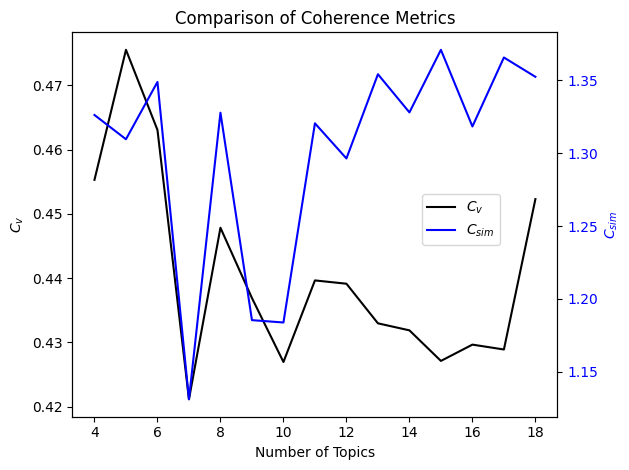

In [33]:
# Create a figure and primary axis
fig, ax1 = plt.subplots()
topic_number = range(4, 19, 1)

ax1.plot(topic_number, coherence_c_v, 'k', label=r'$C_v$')
ax1.set_xlabel('Number of Topics')
ax1.set_ylabel(r'$C_v$', color='k')
ax1.tick_params(axis='y', labelcolor='k')
ax2 = ax1.twinx()
ax2.plot(topic_number, coherence_sim, 'b', label=r'$C_{sim}$')
ax2.set_ylabel(r'$C_{sim}$', color='b')
ax2.tick_params(axis='y', labelcolor='b')
fig.legend(loc="upper right", bbox_to_anchor=(0.80, 0.6))
plt.title('Comparison of Coherence Metrics')
fig.tight_layout()
plt.show()

We observe that indeed both metrics don't give similar results for all the number of topics. We decide to prioritize the similarity coherence score $C_{sim}$ as $C_v$ isn't reliable. To maximize coherence we choose the number of topics to be **15**. We will use this model for the rest of the project. Note that we didn't go further than 19 topics in our exploration because we preferred anyway to keep the method clear and concise for the site. 

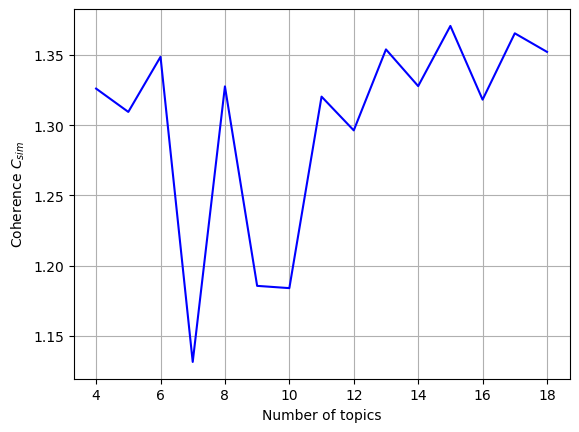

In [34]:
#Figure for the site, clearer
plt.plot(topic_number, coherence_sim, 'b', label=r'$C_{sim}$')
plt.xlabel('Number of topics')
plt.ylabel(r'Coherence $C_{sim}$')
plt.grid()

In [35]:
#TO REMOVE
'''from gensim.models import LdaMulticore
seed = 42
params = {'passes': 10, 'random_state': seed}
model = LdaMulticore(corpus=corpus, num_topics=15, id2word=dictionary, workers=6,
                        passes=params['passes'], random_state=params['random_state'])
model.save("src/models/lda_model15.model")'''

'from gensim.models import LdaMulticore\nseed = 42\nparams = {\'passes\': 10, \'random_state\': seed}\nmodel = LdaMulticore(corpus=corpus, num_topics=15, id2word=dictionary, workers=6,\n                        passes=params[\'passes\'], random_state=params[\'random_state\'])\nmodel.save("src/models/lda_model15.model")'

_Load the LDA model with 15 topics_

In [36]:
lda_model = LdaModel.load("src/models/lda_model15.model")

Let's see what's the word distribution for each topic :

In [37]:
for topic_id, topic_words in lda_model.print_topics(num_words=8):
    print(f"Topic {topic_id}: {topic_words}")

Topic 0: 0.006*"police" + 0.006*"car" + 0.005*"murder" + 0.004*"killer" + 0.004*"shoot" + 0.004*"run" + 0.003*"reveal" + 0.003*"escape"
Topic 1: 0.005*"murder" + 0.005*"say" + 0.005*"woman" + 0.004*"ask" + 0.003*"case" + 0.003*"look" + 0.003*"work" + 0.003*"police"
Topic 2: 0.012*"say" + 0.008*"ask" + 0.008*"get" + 0.008*"room" + 0.007*"house" + 0.007*"look" + 0.007*"door" + 0.006*"run"
Topic 3: 0.004*"Beast" + 0.004*"barricade" + 0.004*"life" + 0.003*"escape" + 0.003*"Marius" + 0.003*"house" + 0.003*"daughter" + 0.003*"order"
Topic 4: 0.005*"game" + 0.005*"say" + 0.004*"team" + 0.004*"ask" + 0.004*"Lord_Blackwood" + 0.004*"Lord" + 0.003*"run" + 0.003*"room"
Topic 5: 0.007*"Macbeth" + 0.006*"king" + 0.005*"son" + 0.005*"King" + 0.004*"army" + 0.004*"prophecy" + 0.004*"castle" + 0.004*"order"
Topic 6: 0.009*"car" + 0.009*"say" + 0.007*"ask" + 0.007*"get" + 0.006*"police" + 0.006*"money" + 0.006*"gun" + 0.005*"shoot"
Topic 7: 0.020*"Sir" + 0.004*"musketeer" + 0.003*"ask" + 0.003*"uncle" 

From this list of words we observe that the preprocessing isn't perfect because some character names still remain as they were not recognize by the spacy analyzer. However we can still easily dicerner some topics. For example the topic 0 seems to describe crime movies, with keywords like police, murder, shoot and car. We asked the NLP AI Chat-GPT ([source](https://chatgpt.com)) to name each topic depending on its words distribution. Here are the names of each topic:

| Topic | Keywords                    | Theme                                  |
|-------|-----------------------------|----------------------------------------|
| 0     | police, car, murder         | Crime and Pursuit                      |
| 1     | murder, woman, case         | Investigative Drama                    |
| 2     | say, ask, room              | Domestic Suspense                      |
| 3     | Beast, barricade, escape    | Struggle and Sacrifice                 |
| 4     | game, team, treasure        | Adventure and Teamwork                 |
| 5     | Macbeth, king, prophecy     | Shakespearean Power Struggles          |
| 6     | car, police, money          | Urban Crime and Violence               |
| 7     | Sir, musketeer, airship     | Historical and Heroic Tales            |
| 8     | Lincoln, look, life         | Identity and Discovery                 |
| 9     | say, money, love            | Emotional Conflict and Drama           |
| 10    | house, vampire, family      | Supernatural and Gothic                |
| 11    | love, family, school        | Family and Everyday Life               |
| 12    | guard, musketeer, sword     | Adventure and Loyalty                  |
| 13    | say, look, castle           | Drama and Character Interaction        |
| 14    | escape, attack, team        | Action and Strategy                    |


Let's add to the dataframe the distribution of topics for each movie, and the main topic (the one with highest distribution).

In [38]:
topic_distrib = [sorted(lda_model.get_document_topics(doc), key=lambda x: x[1], reverse=True) for doc in corpus]
movie_final.insert(loc=len(movie_final.columns), column='Topics', value=topic_distrib)
topic_dic = {
    0: 'Crime and Pursuit',
    1: 'Investigative Drama',
    2: 'Domestic Suspense',
    3: 'Struggle and Sacrifice',
    4: 'Adventure and Teamwork',
    5: 'Shakespearean Power Struggles',
    6: 'Urban Crime and Violence',
    7: 'Historical and Heroic Tales',
    8: 'Identity and Discovery',
    9: 'Emotional Conflict and Drama',
    10: 'Supernatural and Gothic',
    11: 'Family and Everyday Life',
    12: 'Adventure and Loyalty',
    13: 'Drama and Character Interaction',
    14: 'Action and Strategy',
}
movie_final['Main Topic'] = movie_final['Topics'].apply(lambda x : topic_dic[x[0][0]])
movie_final.head()
movie_final.to_csv('Data/movie_final.csv', index=False)

## 2.3 Topics analysis
Are the topics discovered by LDA completely new ? Or are they reflecting genres or other characteristics ?

### 2.3.1 Networks between topics
We begin with networks, where two topics have an edge if they have a genre in common. This is done starting with a bipartite graph between topics and genres. To link a topic $i$ with a genre $j$, we check how often this genre $j$ appear for movies with topic $i$ as main topic. If this proportion is larger than a chosen threshold, we link the topic to the genre. Then we project the bipartite graph to keep only topics as nodes. The edges then represent how many genres two topics have in common. During this procedure we calculate aswell the average probability to have a link between a topic and a genre, if genres were distributed randomly. Comparing this to the proportion of links we actually have in the bipartite graph allows to measure how our topics are representing genres. Note that the size of nodes represent the proportion of movies having this topic as main topic.

The probability of link if topics were independant of genres would be 0.004%.
The proportion of link between topics and genres is 1.289%.


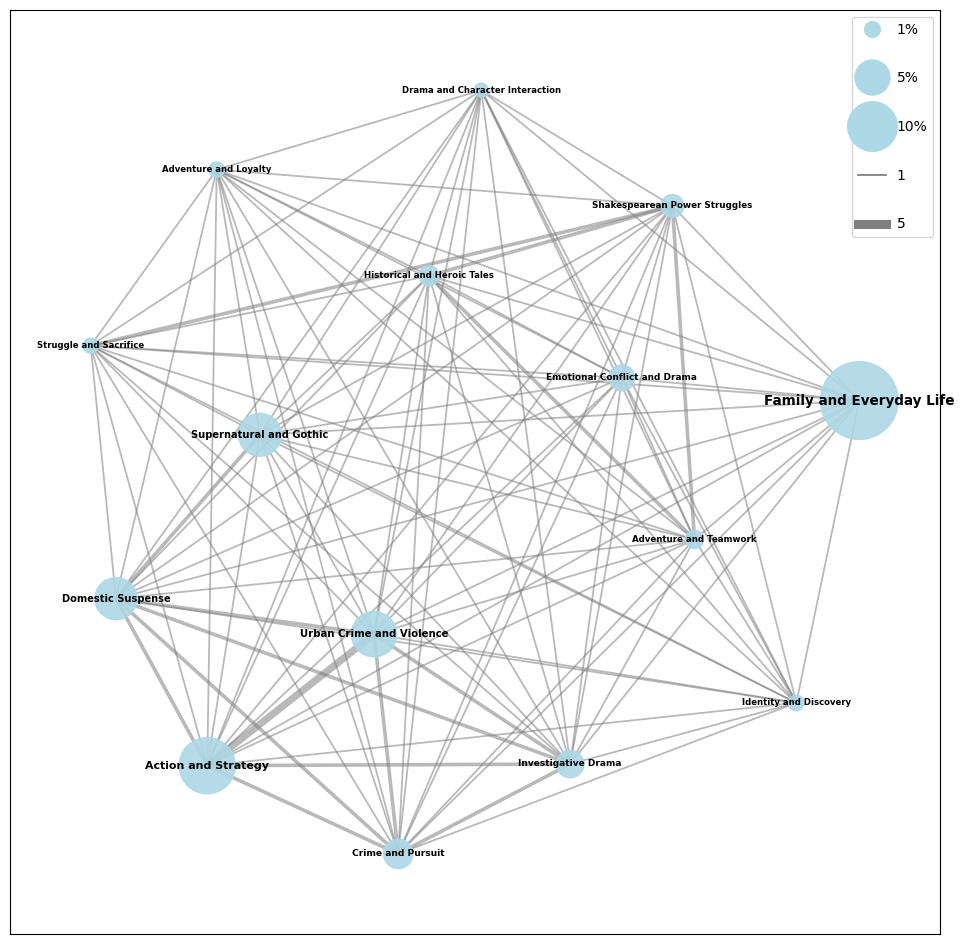

In [39]:
[link_probability_random, link_proportion] = draw_network_genre(movie_final, topic_dic, threshold=0.29)
print(f'The probability of link if topics were independant of genres would be {round(link_probability_random*100,3)}%.')
print(f'The proportion of link between topics and genres is {round(link_proportion*100,3)}%.')

We observe that we have way more links than if our genres were randomly distributed. This means that our topics reflects to some extend the genres. We also see that the `Family and Everyday Life` is the predominant main topic in our dataset. `Action and Strategy` and `Urban Crime and Violence` have the most genres in common.

### Let's do the same analysis with the labels of the MPST dataset added earlier instead of genres.

The probability of link in a random relation between topics and labels would be 4.29%.
The proportion of link between topics and labels is 4.29%.


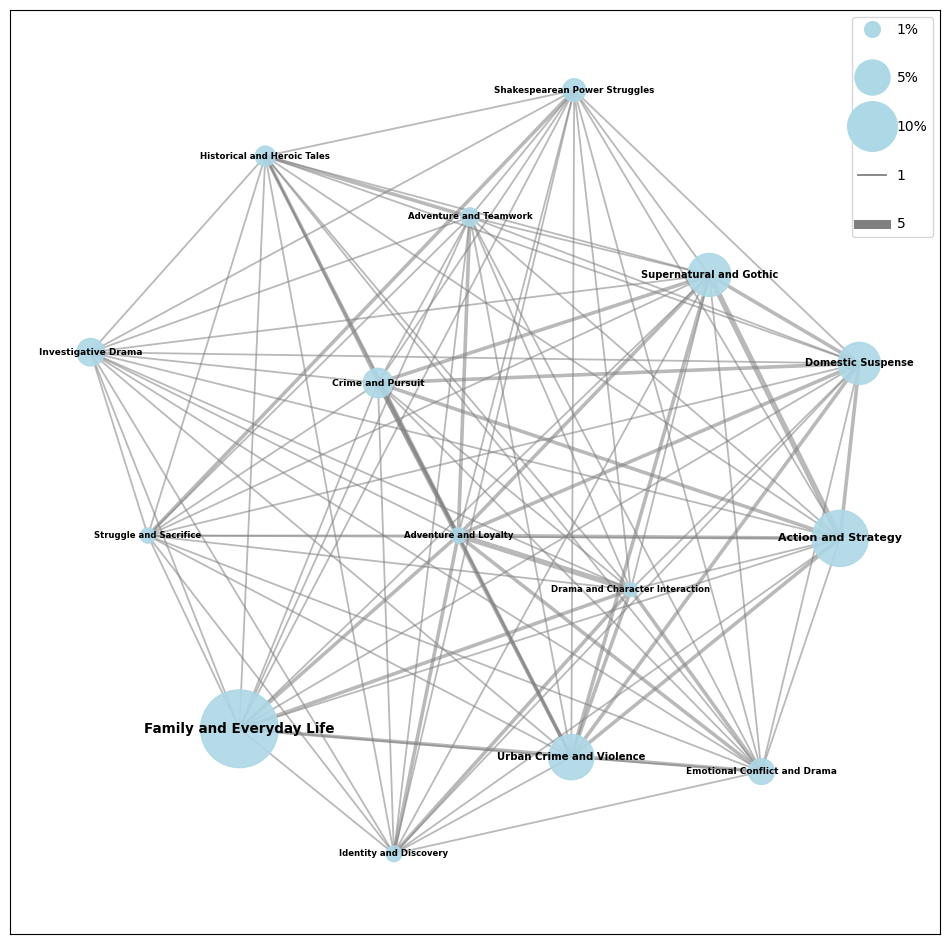

In [40]:
[link_probability_random, link_proportion] = draw_network_tags(movie_final, topic_dic, threshold=0.25)
print(f'The probability of link in a random relation between topics and labels would be {round(link_probability_random*100,3)}%.')
print(f'The proportion of link between topics and labels is {round(link_proportion*100,3)}%.')

The two percentages are surprisingly close. This means labels are statistically random for our topics. We thus can't infer any trends between topics and tags from this network.

### Part 4: Recommendations !!

Now that we have discovered new information about a movie. Let's put it to use for movie recommendation. Give us a movies you like, you will get a new movie recommendation by picking the most similar movie (closest topics).

In [41]:
movie_final['Topics'].head()

0    [(10, 0.7467012), (14, 0.1037234), (5, 0.07242...
1    [(11, 0.75163704), (1, 0.11554898), (6, 0.0902...
2    [(11, 0.8015677), (9, 0.12116513), (2, 0.06243...
3    [(6, 0.6062085), (11, 0.17218398), (14, 0.1055...
4    [(6, 0.6061465), (11, 0.17213035), (14, 0.1055...
Name: Topics, dtype: object

The topics are formatted as `Tuples` we will convert to `np.array` which is easier to compute the distance.

In [42]:
# Ensure all rows in 'Topics' have 15 elements
num_topics = 15

def format_topics(topics, num_topics=15):
    topic_dict = {topic: prob for topic, prob in topics}
    return [topic_dict.get(i, 0) for i in range(num_topics)]

# Convert to list
movie_final['Topics'] = movie_final['Topics'].apply(format_topics)

# Convert to array
movie_final['Topics'] = movie_final['Topics'].apply(np.array)

# Check results
movie_final['Topics'].head()

0    [0.0, 0.0, 0.0, 0.0, 0.07204169034957886, 0.07...
1    [0.0, 0.1155489832162857, 0.04013890400528908,...
2    [0.0, 0.0, 0.06243693456053734, 0.0, 0.0, 0.0,...
3    [0.05606052652001381, 0.050623245537281036, 0....
4    [0.05607469752430916, 0.05076221376657486, 0.0...
Name: Topics, dtype: object

All topics are well formatted let's now compute the most similar movie

In [43]:
def recommend_similar_movie(movie_name):

  # Check that movie name is in the dataframe
  if not (movie_final['Movie name'] == movie_name).any():
    return "Error: This Movie is either mispelled or not in the database."

  else:
    # From movie name get topic score
    movie_infos = movie_final[movie_final['Movie name'] == movie_name].iloc[0]
    other_movies = movie_final[~(movie_final['Movie name'] == movie_name)]

    # Euclidean distances
    distances = other_movies['Topics'].apply(
        lambda x: np.linalg.norm(x - movie_infos['Topics'])
    )

    closest_movie = distances.nsmallest(1).index[-1]
    return print("You should watch" , other_movies['Movie name'].iloc[closest_movie], "(imdb_id:", other_movies['imdb_id'].iloc[closest_movie],")" )

# Prompt the user for input
movie_name = input("Please enter a  movie name: ") # Scarface, Dungeons & Dragons: The Book of Vile Darkness

recommend_similar_movie(movie_name)


'Error: This Movie is either mispelled or not in the database.'

### Continuer l'analyse (ESTEBAN)

In [46]:
# NEED TO FIX THIS

# Check for duplicates in movie_final
nbr_duplicates = movie_final['imdb_id'].count().sum() - movie_final['imdb_id'].nunique()
percent_duplicates = round(nbr_duplicates / movie_final['imdb_id'].count().sum() * 100, 2)
print(f'There is {percent_duplicates} percent of duplicates which is a total of {nbr_duplicates} movies out of {movie_final.shape[0]}.')


There is 27.7 percent of duplicates which is a total of 4045 movies out of 14604.


In [47]:
# Identify duplicate rows based on 'imdb_id' in movie_final

duplicated_rows = movies_ratings[movies_ratings['imdb_id'].duplicated(keep=False)]

# Show duplicated rows
print(duplicated_rows.shape)
display(duplicated_rows.head(16))

(6163, 13)


,imdb_id,plot_synopsis,tags,Wikipedia movie ID,Movie name,Movie release date,Movie runtime,Movie languages,Movie countries,Movie genres,averageRating,numVotes,IMDB Box-office
3,tt0086250,"In May 1980, a Cuban man named Tony Montana (A...","cruelty, murder, dramatic, cult, violence, atm...",76331,Scarface,1932.0,94.0,"[Italian Language, English Language]",[United States of America],"[Crime Fiction, Gangster Film, Black-and-white...",8.3,939727,6.588470e+07
4,tt0086250,"In May 1980, a Cuban man named Tony Montana (A...","cruelty, murder, dramatic, cult, violence, atm...",267848,Scarface,1983.0,170.0,"[English Language, Spanish Language]",[United States of America],"[Crime Fiction, Thriller, Gangster Film, Actio...",8.3,939727,6.588470e+07
8,tt1615065,The movie begins with a video being shot of me...,"revenge, neo noir, murder, violence, flashback",5120572,Savages,1972.0,106.0,[English Language],[United States of America],"[Parody, Black comedy, Drama, Comedy, Indie]",6.4,135772,8.296615e+07
9,tt1615065,The movie begins with a video being shot of me...,"revenge, neo noir, murder, violence, flashback",31676805,Savages,2012.0,131.0,[English Language],[United States of America],"[Thriller, Crime Fiction, Drama]",6.4,135772,7.412310e+07
10,tt1615065,The movie begins with a video being shot of me...,"revenge, neo noir, murder, violence, flashback",26315574,Savages,1974.0,74.0,[English Language],[United States of America],[Thriller],6.4,135772,8.296615e+07
16,tt0402399,"Over a shot of trees reflected in water, a gir...","boring, murder, cult, violence, atmospheric, h...",1278961,The New World,2005.0,136.0,"[Algonquin Language, English Language]","[United States of America, United Kingdom]","[Biography, Adventure, Costume drama, Period p...",6.7,91075,3.053601e+07
17,tt0402399,"Over a shot of trees reflected in water, a gir...","boring, murder, cult, violence, atmospheric, h...",35583379,The New World,2011.0,88.0,[Estonian Language],[Estonia],[Documentary],6.7,91075,3.053601e+13
18,tt1619029,The film begins with a close-up of Jackie Kenn...,flashback,26407560,Jackie,NaN,141.0,"[Malayalam Language, Telugu language, Kannada ...",NaN,[Action],6.6,84226,1.169244e+13
19,tt1619029,The film begins with a close-up of Jackie Kenn...,flashback,16051162,Jackie,1921.0,50.0,"[Silent film, English Language]",[United States of America],"[Silent film, Drama, Black-and-white]",6.6,84226,1.169244e+13
20,tt1619029,The film begins with a close-up of Jackie Kenn...,flashback,35767941,Jackie,2012.0,NaN,"[Dutch Language, English Language]",[Netherlands],"[Comedy film, Drama]",6.6,84226,1.169244e+13


### Movie ratings correlation

In [48]:
print(movie_final.shape)
movie_final.head(2)

(14604, 8)


,imdb_id,Movie name,plot_synopsis,tags,Movie genres,averageRating,Topics,Main Topic
0,tt1733125,Dungeons & Dragons: The Book of Vile Darkness,"Two thousand years ago, Nhagruul the Foul, a s...",violence,['Fantasy'],4.4,"[0.0, 0.0, 0.0, 0.0, 0.07204169034957886, 0.07...",Supernatural and Gothic
1,tt0033045,The Shop Around the Corner,"Matuschek's, a gift store in Budapest, is the ...",romantic,"['Romantic comedy', 'Workplace Comedy', 'Black...",8.0,"[0.0, 0.1155489832162857, 0.04013890400528908,...",Family and Everyday Life


In [49]:
print(movies_ratings.shape)
display('Number of NaNs:', movies_ratings[['averageRating']].isna().sum())
movies_ratings.head(2)

(14686, 13)


'Number of NaNs:'

averageRating    0
dtype: int64

,imdb_id,plot_synopsis,tags,Wikipedia movie ID,Movie name,Movie release date,Movie runtime,Movie languages,Movie countries,Movie genres,averageRating,numVotes,IMDB Box-office
0,tt1733125,"Two thousand years ago, Nhagruul the Foul, a s...",violence,30855958,Dungeons & Dragons: The Book of Vile Darkness,2012.0,90.0,NaN,[United Kingdom],[Fantasy],4.4,2722,NaN
1,tt0033045,"Matuschek's, a gift store in Budapest, is the ...",romantic,76353,The Shop Around the Corner,1940.0,98.0,[English Language],[United States of America],"[Romantic comedy, Workplace Comedy, Black-and-...",8.0,39430,380000.0


In [50]:
movies_ratings_clean = movies_ratings.dropna(subset=['Movie genres']) # drop the rows with missing genres
#movies_ratings_clean = movies_ratings_clean.dropna(subset=['averageRating']) # doesn't change the number of rows -> no NaN
print('movie_ratings shape:', movies_ratings.shape)
print('movie_ratings_clean shape:', movies_ratings_clean.shape)

# Merge movie_final with features_df on the 'imdb_id' column
movie_final_merge = movie_final.copy()


movie_final_merge['averageRating'] = movies_ratings_clean['averageRating'] # movies_ratings has the same order of rows as movie_final
#movie_final_merge = movie_final_merge.merge(movies_ratings_clean[['imdb_id', 'averageRating']], on='imdb_id', how='inner')


print('movie_final shape:', movie_final.shape)
print('movie_final_merge shape:', movie_final_merge.shape)
movie_final_merge.head(2)

movie_ratings shape: (14686, 13)
movie_ratings_clean shape: (14604, 13)
movie_final shape: (14604, 8)
movie_final_merge shape: (14604, 8)


,imdb_id,Movie name,plot_synopsis,tags,Movie genres,averageRating,Topics,Main Topic
0,tt1733125,Dungeons & Dragons: The Book of Vile Darkness,"Two thousand years ago, Nhagruul the Foul, a s...",violence,['Fantasy'],4.4,"[0.0, 0.0, 0.0, 0.0, 0.07204169034957886, 0.07...",Supernatural and Gothic
1,tt0033045,The Shop Around the Corner,"Matuschek's, a gift store in Budapest, is the ...",romantic,"['Romantic comedy', 'Workplace Comedy', 'Black...",8.0,"[0.0, 0.1155489832162857, 0.04013890400528908,...",Family and Everyday Life


In [51]:
# Check for Nan in 'averageRating' column
display(movie_final_merge[['averageRating']].isna().sum())

averageRating    82
dtype: int64

In [52]:
# Find rows where 'averageRating' is NaN
rows_with_nan = movie_final_merge[movie_final_merge['averageRating'].isna()]

# Display the first row with NaN in 'averageRating'
rows_with_nan.head()


,imdb_id,Movie name,plot_synopsis,tags,Movie genres,averageRating,Topics,Main Topic
45,tt0070222,Invasion of the Bee Girls,"In a cheap motel near Peckham California, a ma...","tragedy, pornographic, murder","['Thriller', 'Science Fiction', 'Drama', 'Indie']",NaN,"[0.1645553559064865, 0.2582719326019287, 0.0, ...",Action and Strategy
115,tt0112740,Crimson Tide,A rebel force has taken over nuclear missile l...,"cult, suspenseful, comedy","['Thriller', 'Action Thrillers', 'Action/Adven...",NaN,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0151304481551...",Action and Strategy
252,tt1316536,The Loved Ones,Brent (Xavier Samuel) is driving with his fath...,"suspenseful, cruelty, murder, violence, horror...",['Horror'],NaN,"[0.07038986682891846, 0.0, 0.8313496708869934,...",Domestic Suspense
860,tt0042248,Big House Bunny,"Needing to get away from hunters, Bugs digs a ...",psychedelic,"['Family Film', 'Comedy', 'Animation']",NaN,"[0.0, 0.05274073779582977, 0.2095979005098343,...",Urban Crime and Violence
1261,tt0022835,Dr. Jekyll and Mr. Hyde,"Dr. Henry Jekyll (pronounced ""jeekle"") (Fredri...","psychological, gothic, murder, violence, good ...","['Silent film', 'Horror', 'Indie', 'Science Fi...",NaN,"[0.0, 0.0, 0.48130524158477783, 0.0, 0.0, 0.0,...",Domestic Suspense


In [53]:
print(movies_ratings[movies_ratings['imdb_id'] == 'tt1316536']['averageRating'])
print(movie_final_merge[movies_ratings['imdb_id'] == 'tt1316536']['averageRating'])

255    6.6
Name: averageRating, dtype: float64
255    6.6
Name: averageRating, dtype: float64


/var/folders/c3/lx552p8n5hn_0p4zwmkvswr80000gn/T/ipykernel_16269/110766458.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [54]:
# Identify duplicate rows based on 'imdb_id' in movie_final

duplicated_rows = movie_final_merge[movie_final_merge['imdb_id'].duplicated(keep=False)]

# Show duplicated rows
print(duplicated_rows.shape)
display(duplicated_rows.head(4))

(6074, 8)


,imdb_id,Movie name,plot_synopsis,tags,Movie genres,averageRating,Topics,Main Topic
3,tt0086250,Scarface,"In May 1980, a Cuban man named Tony Montana (A...","cruelty, murder, dramatic, cult, violence, atm...","['Crime Fiction', 'Gangster Film', 'Black-and-...",8.3,"[0.05606052652001381, 0.050623245537281036, 0....",Urban Crime and Violence
4,tt0086250,Scarface,"In May 1980, a Cuban man named Tony Montana (A...","cruelty, murder, dramatic, cult, violence, atm...","['Crime Fiction', 'Thriller', 'Gangster Film',...",8.3,"[0.05607469752430916, 0.05076221376657486, 0.0...",Urban Crime and Violence
8,tt1615065,Savages,The movie begins with a video being shot of me...,"revenge, neo noir, murder, violence, flashback","['Parody', 'Black comedy', 'Drama', 'Comedy', ...",6.4,"[0.0, 0.036235302686691284, 0.1144476383924484...",Urban Crime and Violence
9,tt1615065,Savages,The movie begins with a video being shot of me...,"revenge, neo noir, murder, violence, flashback","['Thriller', 'Crime Fiction', 'Drama']",6.4,"[0.0, 0.03623932600021362, 0.11435967683792114...",Urban Crime and Violence


Now that no Nan values remain we can move on to the PCA

## CHANGE comments data types from tuples not normalized

In [55]:
print(movie_final_merge['Topics'].head().value_counts())


Topics
[0.0, 0.0, 0.0, 0.0, 0.07204169034957886, 0.0724283754825592, 0.0, 0.0, 0.0, 0.0, 0.746701180934906, 0.0, 0.0, 0.0, 0.10372339934110641]                       1
[0.0, 0.1155489832162857, 0.04013890400528908, 0.0, 0.0, 0.0, 0.090211883187294, 0.0, 0.0, 0.0, 0.0, 0.7516370415687561, 0.0, 0.0, 0.0]                        1
[0.0, 0.0, 0.06243693456053734, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.12116512656211853, 0.0, 0.8015676736831665, 0.0, 0.013975027948617935, 0.0]                    1
[0.05606052652001381, 0.050623245537281036, 0.0, 0.0, 0.0, 0.0, 0.6062085032463074, 0.0, 0.0, 0.0, 0.0, 0.17218397557735443, 0.0, 0.0, 0.10554037988185883]    1
[0.05607469752430916, 0.05076221376657486, 0.0, 0.0, 0.0, 0.0, 0.606146514415741, 0.0, 0.0, 0.0, 0.0, 0.17213034629821777, 0.0, 0.0, 0.10551364719867706]      1
Name: count, dtype: int64


We notice that movies don't have a value for the genres they were found to have a probability of 0 to be in. We thus will add all the remaining topics for which the movies' likelihood of being in it is 0.

In [56]:
# Ensure all rows in 'Topics' have 15 elements
num_topics = 15

# Normalize each row to have all topics, with missing ones assigned a probability of 0
def normalize_topics(topics, num_topics=15):
    topic_dict = {topic: prob for topic, prob in topics}
    return [topic_dict.get(i, 0) for i in range(num_topics)]

movie_final_merge['Normalized Topics'] = movie_final_merge['Topics'].apply(normalize_topics)

print(movie_final_merge['Normalized Topics'].head().value_counts())

TypeError: cannot unpack non-iterable numpy.float64 object

In [62]:
# Not interactive PCA plot
'''
# Extract normalized topic probabilities
topic_probabilities = np.array(movie_final['Normalized Topics'].tolist())

# Perform PCA to reduce to 3 dimensions
pca = PCA(n_components=3)
reduced_data = pca.fit_transform(topic_probabilities)

# Add reduced dimensions to the dataframe
movie_final['PC1'] = reduced_data[:, 0]
movie_final['PC2'] = reduced_data[:, 1]
movie_final['PC3'] = reduced_data[:, 2]

# Visualize in 3D
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

# Color by 'Main Topic'
topic_labels = movie_final['Main Topic']
unique_topics = topic_labels.unique()
topic_colors = {topic: i for i, topic in enumerate(unique_topics)}
color_mapping = topic_labels.map(topic_colors)

scatter = ax.scatter(
    reduced_data[:, 0], reduced_data[:, 1], reduced_data[:, 2],
    c=color_mapping, cmap='tab10', s=10, alpha=0.8
)

# Add legend
legend = ax.legend(*scatter.legend_elements(), title="Main Topic", loc="best")
ax.add_artist(legend)

# Label axes
ax.set_title("3D PCA of Movies")
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")

plt.show()
'''


' \n# Extract normalized topic probabilities\ntopic_probabilities = np.array(movie_final[\'Normalized Topics\'].tolist())\n\n# Perform PCA to reduce to 3 dimensions\npca = PCA(n_components=3)\nreduced_data = pca.fit_transform(topic_probabilities)\n\n# Add reduced dimensions to the dataframe\nmovie_final[\'PC1\'] = reduced_data[:, 0]\nmovie_final[\'PC2\'] = reduced_data[:, 1]\nmovie_final[\'PC3\'] = reduced_data[:, 2]\n\n# Visualize in 3D\nfig = plt.figure(figsize=(14, 10))\nax = fig.add_subplot(111, projection=\'3d\')\n\n# Color by \'Main Topic\'\ntopic_labels = movie_final[\'Main Topic\']\nunique_topics = topic_labels.unique()\ntopic_colors = {topic: i for i, topic in enumerate(unique_topics)}\ncolor_mapping = topic_labels.map(topic_colors)\n\nscatter = ax.scatter(\n    reduced_data[:, 0], reduced_data[:, 1], reduced_data[:, 2],\n    c=color_mapping, cmap=\'tab10\', s=10, alpha=0.8\n)\n\n# Add legend\nlegend = ax.legend(*scatter.legend_elements(), title="Main Topic", loc="best")\nax.a

In [63]:
from sklearn.decomposition import PCA #ADD AT THE TOP

# Ensure all rows in 'Topics' have 15 elements
num_topics = 15

# Normalize each row to have all topics, with missing ones assigned a probability of 0
def normalize_topics(topics, num_topics=15):
    topic_dict = {topic: prob for topic, prob in topics}
    return [topic_dict.get(i, 0) for i in range(num_topics)]

movie_final_merge['Normalized Topics'] = movie_final_merge['Topics'].apply(normalize_topics)

In [64]:
# Extract normalized topic probabilities
topic_probabilities = np.array(movie_final_merge['Normalized Topics'].tolist())

# Perform PCA to reduce to 3 dimensions
pca = PCA(n_components=3)
reduced_data = pca.fit_transform(topic_probabilities)

# Add reduced dimensions to the dataframe
movie_final_merge['PC1'] = reduced_data[:, 0]
movie_final_merge['PC2'] = reduced_data[:, 1]
movie_final_merge['PC3'] = reduced_data[:, 2]

In [65]:
# Create an interactive 3D scatter plot with Plotly
fig = px.scatter_3d(
    movie_final_merge,
    x='PC1',
    y='PC2',
    z='PC3',
    color='Main Topic',  # Color by the main topic
    size=None,  # You can set this to a feature column for dynamic sizing
    title="Interactive 3D PCA of Movies",
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'PC3': 'Principal Component 3'},
    opacity=1, # Can be changed in order to view the interior with more detail
    width=1200,  # Increase the width of the plot
    height=800   # Increase the height of the plot
)

# Update the trace to make sure the legend dots are a constant size
fig.update_traces(
    marker=dict(size=1),  # Set dynamic size for plot dots
    selector=dict(mode='markers')
)

# Fix the legend dots size to be constant (e.g., size 10)
fig.update_layout(
    legend=dict(
        itemsizing='constant',  # Keep the legend items a constant size
        tracegroupgap=0         # Adjust spacing between legend entries
    )
)

# Show the plot
fig.show()

In [66]:
# Now a version with the color representing the movie's ratings_df

fig = px.scatter_3d(
    movie_final_merge,
    x='PC1',
    y='PC2',
    z='PC3',
    color='averageRating',  # Use the IMDb Rating for color coding
    title="Interactive 3D PCA of Movies' ratings",
    labels={'PC1': 'Principal Component 1', 'PC2': 'Principal Component 2', 'PC3': 'Principal Component 3'},
    opacity=1,
    size=None,  # Dynamic dot sizes based on your data (optional)
    width=1200,
    height=800,
    color_continuous_scale='RdYlGn',  # Color scale from red (low) to green (high)
)

# Update the trace to make sure the legend dots are a constant size
fig.update_traces(
    marker=dict(
        size=1,  # Set dynamic size for plot dots
        colorbar=dict(
            title="IMDb Rating",
            tickvals=[0, 5, 10],  # Limits ratings between 4 and 9 since the results are distributed nearly like a Gaussian around 7.
            ticktext=['4', '5', '9']  # Corresponding labels for the ticks
        )
    ),
    selector=dict(mode='markers')
)

# Fix the legend dots size to be constant (e.g., size 10)
fig.update_layout(
    legend=dict(
        itemsizing='constant',  # Keep the legend items a constant size
        tracegroupgap=0         # Adjust spacing between legend entries
    )
)

# Show the figure
fig.show()


In [67]:
# Check for Nan in 'averageRating' column
display(movie_final_merge[['averageRating']].isna().sum())


,0
averageRating,82


There are NaN values left in averageRating

## 3. Can others features explain the raitngs ? 

In this part, we want to determine wheter the ratings can be explained by other features. To do so, we will test three different models for linear regression. The first model will use only numerical features, the second will use only categorical features, and the third will combine both numerical and categorical features. This approach will allow us to determine which model performs best and identify which features have the most significant impact on the average ratings.

In [3]:
# Load the dataset
data = features_df.copy()

# Select relevant columns and target variable
features = ['tags', 'Movie genres', 'Movie languages', 'Movie countries', 'Movie runtime', 'IMDB Box-office', 'numVotes']
target = 'averageRating'

# Drop rows with missing values in features or target
data_cleaned = data[features + [target]].dropna()

# Define textual and numerical features
textual_features = ['tags', 'Movie genres', 'Movie languages', 'Movie countries']
numerical_features = ['Movie runtime', 'IMDB Box-office', 'numVotes']

# Extract numerical features
numerical_features_data = data_cleaned[numerical_features].fillna(0).values

# Define target variable
y = data_cleaned[target]

_Comment: In this analysis, we removed all rows with missing values, as they need to be handled for linear regression. We tested two options: keeping the 'box office' feature (which has many missing values) and removing those rows, or dropping 'box office' to keep more data. Keeping 'box office' and removing the rows gave better results, so we chose this approach._

The first model that we test is the one with numerical data.

In [5]:
# Standardize numerical features
scaler = StandardScaler()
numerical_features_data_scaled = scaler.fit_transform(numerical_features_data)

# Train model
X_train_num, X_test_num, y_train_num, y_test_num = train_test_split(numerical_features_data_scaled, y, test_size=0.2, random_state=42)
rmse_num, r2_num, y_pred_num = train_and_evaluate(X_train_num, X_test_num, y_train_num, y_test_num)

Next is the model containing categorical data.

In [6]:
# Process textual features using the reusable function
vectorizers, tfidf_combined, pca, tfidf_reduced = process_text_features_with_pca(data=data_cleaned, textual_features=textual_features, max_features=50, pca_variance=0.95,random_state=42
)

# Train model
X_train_cat, X_test_cat, y_train_cat, y_test_cat = train_test_split(tfidf_reduced, y, test_size=0.2, random_state=42)
rmse_cat, r2_cat, y_pred_cat = train_and_evaluate(X_train_cat, X_test_cat, y_train_cat, y_test_cat)

And finally both combined.

In [7]:
# Combine PCA-reduced TF-IDF features with scaled numerical features
X_combined_reduced = np.hstack([tfidf_reduced, numerical_features_data_scaled])

# Train model
X_train_comb, X_test_comb, y_train_comb, y_test_comb = train_test_split(X_combined_reduced, y, test_size=0.2, random_state=42)
rmse_comb, r2_comb, y_pred_comb = train_and_evaluate(X_train_comb, X_test_comb, y_train_comb, y_test_comb)


Now that we have all the model we will compare them.

In [8]:
# Compare the results
comparison_results = pd.DataFrame({
    'Feature Set': ['Numerical Only', 'Categorical Only', 'Combined'],
    'RMSE': [rmse_num, rmse_cat, rmse_comb],
    'R²': [r2_num, r2_cat, r2_comb]
})

print(comparison_results)

        Feature Set      RMSE        R²
0    Numerical Only  0.975319  0.130247
1  Categorical Only  0.897272  0.263876
2          Combined  0.870385  0.307331


From this results, we see that categorical features are better at predicting movie ratings, explaining 26% of the variance, while numerical features explain only 13%. Combining both gives the best results, explaining 31% of the variance and having the lowest error. This shows that using both types of features together works best.

To display the most important features in each PCA component, we need to analyze the PCA loadings. These loadings represent how much each original feature contributes to each PCA component.

In [13]:
# Get the top contributions for PCA components using the function
top_contributions = get_pca_top_contributions(pca, vectorizers, num_components_to_inspect=3, top_n=10)
display(top_contributions)


{'PCA Component 1': [('kingdom', 0.18873965909149007),
  ('india', 0.14208593200154016),
  ('world', 0.14063545851632323),
  ('cinema', 0.13871130784152674),
  ('hindi', 0.10493313421619967),
  ('france', 0.0959096219769524),
  ('french', 0.09278667889593446),
  ('drama', 0.08493182372264775),
  ('germany', 0.059008461699038894),
  ('italy', 0.0535685622497521)],
 'PCA Component 2': [('romantic', 0.39312939583809664),
  ('comedy', 0.3175814692259126),
  ('romance', 0.1708458509517985),
  ('romantic', 0.16554161544238838),
  ('film', 0.14536597214746355),
  ('drama', 0.13748816784828674),
  ('musical', 0.08868538708473968),
  ('comedy', 0.08309993287061934),
  ('family', 0.07596063361109638),
  ('fantasy', 0.06803748063738307)],
 'PCA Component 3': [('kingdom', 0.598849662854257),
  ('english', 0.47117920528013035),
  ('language', 0.2928945782944815),
  ('drama', 0.11225845078792114),
  ('romantic', 0.10335843077975528),
  ('comedy', 0.08189440266832236),
  ('united', 0.0793977469449793

# GIVE AN ANALYSIS OF THE COMPONENTS?

We also analyze the model's performance by plotting relevant metrics. 

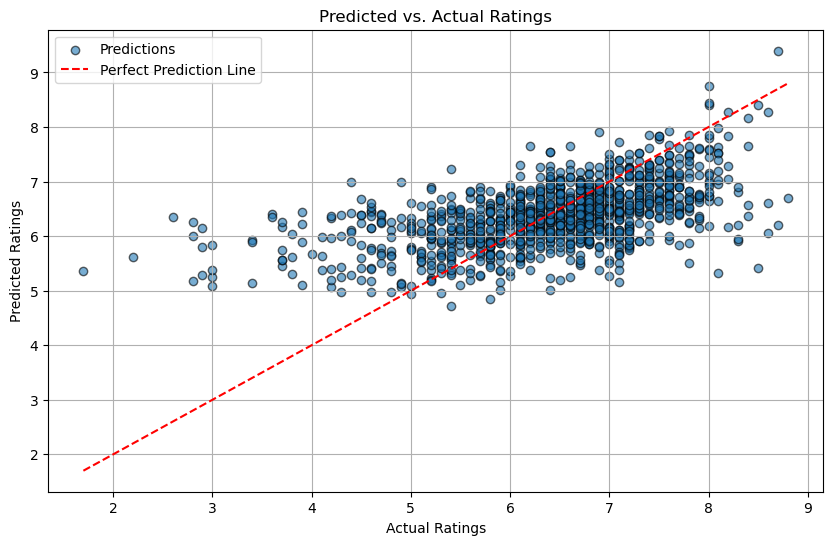

In [14]:
# Predicted vs. Actual Ratings
plt.figure(figsize=(10, 6))
plt.scatter(y_test_comb, y_pred_comb, alpha=0.6, edgecolor='k', label='Predictions')
plt.plot([min(y_test_comb), max(y_test_comb)], [min(y_test_comb), max(y_test_comb)], 
         color='red', linestyle='--', label='Perfect Prediction Line')
plt.xlabel('Actual Ratings')
plt.ylabel('Predicted Ratings')
plt.title('Predicted vs. Actual Ratings')
plt.legend()
plt.grid()
plt.show()

This scatter plot shows the relationship between the model's predicted ratings and the actual ratings. The red dashed line represents perfect predictions where the predicted and actual ratings are equal. Most predictions cluster near this line, especially in the middle range of ratings (5 to 7). However, the spread increases at the extremes, indicating that the model struggles to predict very high or very low ratings accurately. This suggests that while the model performs well for average-rated movies, additional features or non-linear modeling may be needed to handle edge cases.

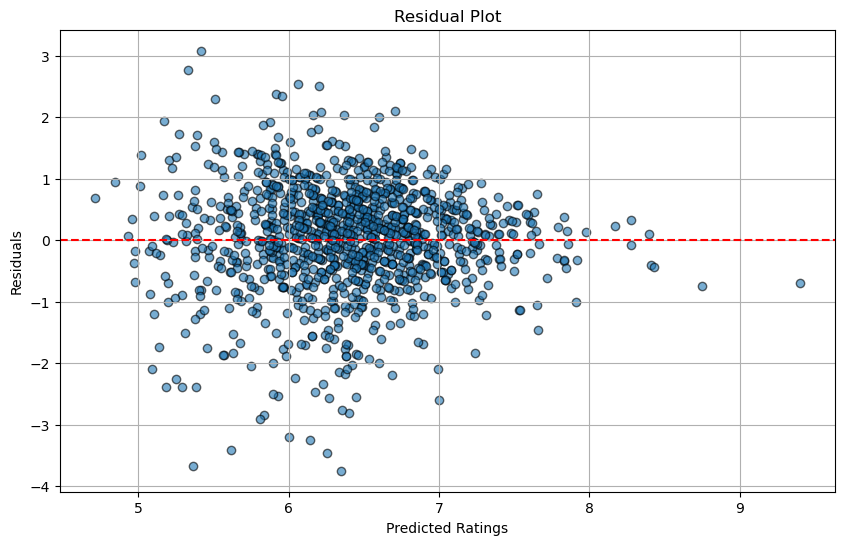

In [15]:
# Residual Plot
residuals_comb = y_test_comb - y_pred_comb
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_comb, residuals_comb, alpha=0.6, edgecolor='k')
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Predicted Ratings')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.grid()
plt.show()

The residual plot help visualizes the differences between actual and predicted ratings (residuals) plotted against the predicted ratings. Ideally, residuals should be randomly scattered around the zero-error line (red dashed line). Here, the residuals are mostly centered around zero, indicating no strong systematic bias in the predictions. However, there is some spread, particularly at higher predicted ratings, suggesting the model's performance weakens for certain types of movies. 

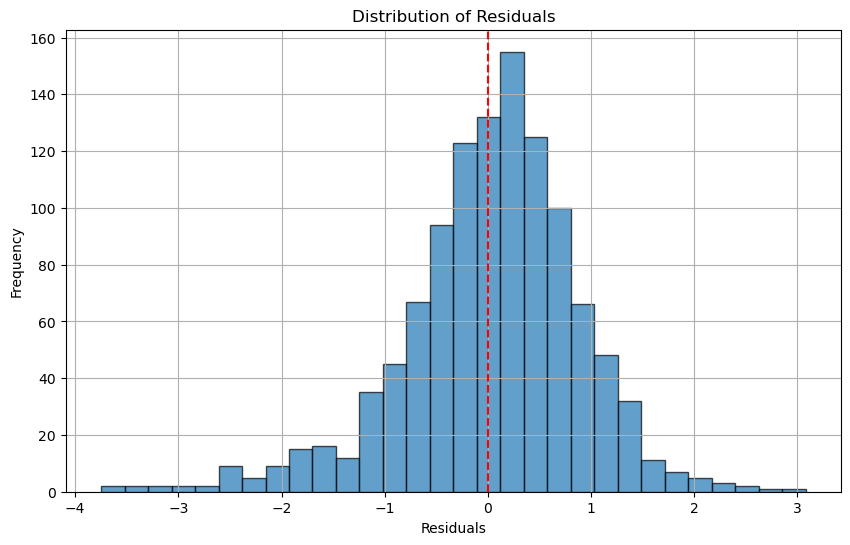

In [16]:
# Error Distribution
plt.figure(figsize=(10, 6))
plt.hist(residuals_comb, bins=30, alpha=0.7, edgecolor='k')
plt.axvline(0, color='red', linestyle='--')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Distribution of Residuals')
plt.grid()
plt.show()


The histogram shows the frequency distribution of residuals, with a red dashed line at zero representing perfect predictions. The residuals are symmetrically distributed and centered around zero, which is a good sign for a regression model. Most residuals fall within the range of -2 to +2, indicating that the model generally makes accurate predictions. However, the presence of outliers in the tails suggests there are a few movies for which the model struggles to predict ratings accurately. These outliers may point to missing features or complexities not captured by the model.

## 3.2 Better than random model ? 

Finally, we will ensure our model is better than a random one. To do so, we will randomly shuffle the x-axis many time to compare it with our model performance results. 

In [19]:
# Call the test_significance function
rmse_shuffled_list, r2_shuffled_list = test_significance(X_combined_reduced=X_combined_reduced, y=y, rmse_comb=rmse_comb, r2_comb=r2_comb,n_iterations=100)


Shuffled Model Performance with Statistical Significance   Metric  Combined Model  Random Model (Mean)  \
0   RMSE        0.870385             1.059966   
1     R²        0.307331            -0.027298   

   Mean Difference (Combined - Random)        p-value  
0                             0.189581  9.276576e-158  
1                            -0.334629  9.357169e-154  


The combined model is significantly better than the random model in both RMSE and $R^2$, with extremely low p-values showing the robustness and consistency of this difference. This validates that the combined model effectively captures meaningful relationships in the dataset.